

##**GPU**

In [ ]:
!nvidia-smi

Sat May 27 15:21:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Install**

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 31.1 MB/s eta 0:00:00


In [ ]:
!pip install torchsummary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##**Imports**

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
import torch.backends.cudnn as cudnn

import torchvision
from torchvision.datasets import MNIST
from torchvision import transforms as T

import matplotlib.pyplot as plt
import numpy as np

from torchmetrics import Accuracy
from torchsummary import summary

from tqdm import tqdm
import cv2
import os
import re
import random

# **Dataset**

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d theblackmamba31/landscape-image-colorization

100% 192M/192M [00:10<00:00, 20.7MB/s]
100% 192M/192M [00:10<00:00, 19.2MB/s]


In [ ]:
!unzip /content/landscape-image-colorization.zip

Streaming output truncated to the last 5000 lines.
  inflating: landscape Images/gray/2914.jpg  
  inflating: landscape Images/gray/2915.jpg  
  inflating: landscape Images/gray/2916.jpg  
  inflating: landscape Images/gray/2917.jpg  
  inflating: landscape Images/gray/2918.jpg  
  inflating: landscape Images/gray/2919.jpg  
  inflating: landscape Images/gray/292.jpg  
  inflating: landscape Images/gray/2920.jpg  
  inflating: landscape Images/gray/2921.jpg  
  inflating: landscape Images/gray/2922.jpg  
  inflating: landscape Images/gray/2923.jpg  
  inflating: landscape Images/gray/2924.jpg  
  inflating: landscape Images/gray/2925.jpg  
  inflating: landscape Images/gray/2926.jpg  
  inflating: landscape Images/gray/2927.jpg  
  inflating: landscape Images/gray/2928.jpg  
  inflating: landscape Images/gray/2929.jpg  
  inflating: landscape Images/gray/293.jpg  
  inflating: landscape Images/gray/2930.jpg  
  inflating: landscape Images/gray/2931.jpg  
  inflating: landscape Images/g

In [ ]:
home = '/content/landscape Images/'
total_images = len(os.listdir(home+'color'))

In [ ]:
random_indices = random.sample(list(range(total_images)),total_images)
train_nums = round(total_images*0.8)
train_indices = random_indices[:train_nums]
test_indices = random_indices[train_nums:]
len(train_indices), len(test_indices)

(5703, 1426)

## Transform

In [ ]:
train_transforms = T.Compose([T.ToPILImage(),
                              T.ToTensor()])

test_transforms = T.Compose([T.ToPILImage(),
                             T.ToTensor()])

## Custom Dataset

In [ ]:
import os
import pandas as pd
from torchvision.io import read_image
from torch.utils.data import Dataset
import torch.nn.functional as F
import torch
from skimage.color import rgb2lab, lab2rgb

class EncoderDataset(Dataset):
    def __init__(self, indices, img_dir, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.img_indices = indices
        self.gray_path = img_dir+'gray/'
        self.color_path = img_dir+'color/'
    
    def __len__(self):
        return len(self.img_indices)
        
    def __getitem__(self, idx):
        img_name = str(idx)+'.jpg'
        image = read_image(self.gray_path+img_name)
        image = image.unsqueeze(0)
        image = F.interpolate(image,(160,160))
        image = image.squeeze(0)
        image = image.permute(1,2,0)
        image = image.repeat(1,1,3)
        image = image.permute(2,0,1)
        label = read_image(self.color_path+img_name)
        label = label.unsqueeze(0)
        label = F.interpolate(label,(160,160))
        label = label.squeeze(0)
        label = label.permute(1,2,0)
        label = label.permute(2,0,1)
        image = torch.tensor(rgb2lab(image.permute(1,2,0)/255))
        label = torch.tensor(rgb2lab(label.permute(1,2,0)/255))
        
        image = (image + torch.tensor([0, 128, 128])) / torch.tensor([100, 255, 255])
        label = (label + torch.tensor([0, 128, 128])) / torch.tensor([100, 255, 255])
        
        image = image.permute(2,0,1)
        label = label.permute(2,0,1)
        #Use L channel from image to predict a,b channels of label
        image = image[:1,:,:]
        label = label[1:,:,:] 
        return image, label

## DataLoader

In [ ]:
train_dataset = EncoderDataset(indices = train_indices,img_dir = home)
test_dataset = EncoderDataset(indices = test_indices,img_dir = home)
train_loader = DataLoader(train_dataset,batch_size=16,shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True)

In [ ]:
img,label = next(iter(train_loader))
sample_image,sample_label = img[0], label[0]
print(sample_image.shape, sample_label.shape)

torch.Size([1, 160, 160]) torch.Size([2, 160, 160])


## Visualize

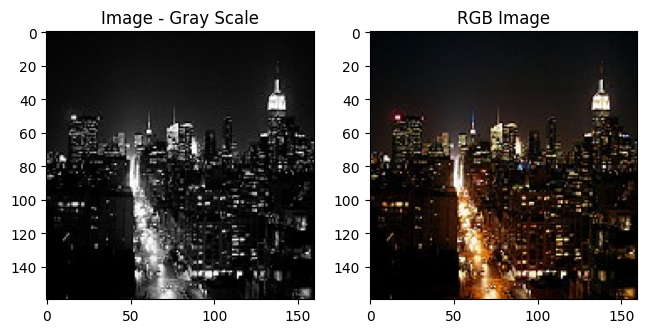

In [ ]:
fig = plt.figure(figsize=(16,16))
plt.subplot(441)
plt.imshow(sample_image.permute(1,2,0),cmap='gray')
plt.title('Image - Gray Scale')




plt.subplot(442)
color_image = torch.cat((sample_image,sample_label),dim=0).permute(1,2,0)
color_image = color_image * torch.tensor([100,255,255]) -torch.tensor([0,128,128])
color_image = lab2rgb(color_image)
plt.imshow(color_image)
plt.title('RGB Image')
plt.show()

# **Model**

In [ ]:
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()
        ## encoder layers ##
        self.conv1 = nn.Conv2d(1, 64, 3,stride=1,padding=1)
        self.conv2 = nn.Conv2d(64, 64, 3, stride=2,padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3,stride=2,padding=1)
        self.conv4 = nn.Conv2d(128, 256, 3,stride=2,padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        
        ## decoder layers ##
        self.t_conv1 = nn.ConvTranspose2d(256, 128, 3, stride=2,padding=1,output_padding=1)
        self.t_conv2 = nn.ConvTranspose2d(256, 64, 3, stride=2,padding=1,output_padding=1)
        self.t_conv3 = nn.ConvTranspose2d(128, 128, 3, stride=2,padding=1,output_padding=1)
        self.t_conv4 = nn.ConvTranspose2d(192, 15, 3, stride=1,padding=1)
        self.dropout = nn.Dropout(0.2)
        self.converge = nn.Conv2d(16,2,3,stride=1,padding=1)

    def forward(self, x):
        x1 = F.relu(self.conv1(x))
        x2 = F.relu(self.conv2(x1))
        x3 = F.relu(self.conv3(x2))
        x4 = F.relu(self.conv4(x3))
        xd = F.relu(self.t_conv1(x4))
        xd = torch.cat((xd, x3), dim=1)
        xd = self.dropout(xd)
        xd = F.relu(self.t_conv2(xd))
        xd = torch.cat((xd, x2), dim=1)
        xd = self.dropout(xd)
        xd = F.relu(self.t_conv3(xd))
        xd = torch.cat((xd, x1), dim=1)
        xd = self.dropout(xd)
        xd = F.relu(self.t_conv4(xd))
        xd = torch.cat((xd, x), dim=1)
        x_out = F.relu(self.converge(xd))
        return x_out

In [ ]:
model = ConvAutoencoder()
model

ConvAutoencoder(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (t_conv1): ConvTranspose2d(256, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  (t_conv2): ConvTranspose2d(256, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  (t_conv3): ConvTranspose2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  (t_conv4): ConvTranspose2d(192, 15, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout): Dropout(p=0.2, inplace=False)
  (converge): Conv2d(16, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [ ]:
def num_params(model):
  nums = sum(p.numel() for p in model.parameters())/1e6
  return nums

In [ ]:
num_params(model)

1.022961

# **Device**

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = ConvAutoencoder().to(device)

# **Loss & Optimizer**

In [ ]:
loss_fn = nn.MSELoss()
optimizer = optim.SGD(model.parameters() , lr = 0.01)

# **Utils**

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# **Functions**

In [ ]:
def train_one_epoch(model, train_loader, loss_fn, optimizer, epoch=None):
  model.train()
  loss_train = AverageMeter()
  with tqdm(train_loader, unit="batch") as tepoch:
    for inputs, targets in tepoch:
      if epoch is not None:
        tepoch.set_description(f"Epoch {epoch}")
      inputs = inputs.to(device)
      targets = targets.to(device)
      outputs = model(inputs)     
      loss = loss_fn(outputs, targets)
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()

      loss_train.update(loss.item())
      tepoch.set_postfix(loss=loss_train.avg)
  return model, loss_train.avg

In [ ]:
def validation(model, test_loader, loss_fn):
  model.eval()
  with torch.no_grad():
    loss_valid = AverageMeter()
    for i, (inputs, targets) in enumerate(test_loader):
      inputs = inputs.to(device)
      targets = targets.to(device)
      outputs = model(inputs)
      loss = loss_fn(outputs, targets)      
      loss_valid.update(loss.item())
  return loss_valid.avg

##check forward path

Calculate loss for one batch

In [ ]:
x_batch , y_batch = next(iter(train_loader))
outputs = model(x_batch.to(device))
loss = loss_fn(outputs , y_batch.to(device))
print(loss)

tensor(0.1520, device='cuda:0', grad_fn=<MseLossBackward0>)


##train more epochs

In [ ]:
model = ConvAutoencoder().to(device)

In [ ]:
loss_fn = nn.MSELoss()
optimizer = optim.SGD(model.parameters() , lr = 0.01)

In [ ]:
loss_train_hist = []
loss_valid_hist = []

best_loss_valid = torch.inf
epoch_counter = 0

In [ ]:
num_epochs = 15

for epoch in range(num_epochs):
  # Train
  model, loss_train = train_one_epoch(model,
                                      train_loader, 
                                      loss_fn, 
                                      optimizer,
                                      epoch)
  # Validation
  loss_valid = validation(model,
                          test_loader,
                          loss_fn)
  
  loss_train_hist.append(loss_train)
  loss_valid_hist.append(loss_valid)
  
  print(f'Valid: Loss = {loss_valid:.4}')
  
  if loss_valid < best_loss_valid:
    torch.save(model, 'model.pt')
    best_loss_valid = loss_valid
    print('Model Saved!')

  print()
  epoch_counter += 1

Epoch 0: 100%|██████████| 357/357 [01:32<00:00,  3.84batch/s, loss=0.0144]


Valid: Loss = 0.004198
Model Saved!



Epoch 1: 100%|██████████| 357/357 [01:30<00:00,  3.94batch/s, loss=0.00609]


Valid: Loss = 0.003842
Model Saved!



Epoch 2: 100%|██████████| 357/357 [01:30<00:00,  3.94batch/s, loss=0.00544]


Valid: Loss = 0.003793
Model Saved!



Epoch 3: 100%|██████████| 357/357 [01:32<00:00,  3.88batch/s, loss=0.00506]


Valid: Loss = 0.003676
Model Saved!



Epoch 4: 100%|██████████| 357/357 [01:31<00:00,  3.90batch/s, loss=0.00481]


Valid: Loss = 0.003576
Model Saved!



Epoch 5: 100%|██████████| 357/357 [01:31<00:00,  3.89batch/s, loss=0.00462]


Valid: Loss = 0.003533
Model Saved!



Epoch 6: 100%|██████████| 357/357 [01:31<00:00,  3.92batch/s, loss=0.00447]


Valid: Loss = 0.003522
Model Saved!



Epoch 7: 100%|██████████| 357/357 [01:29<00:00,  3.98batch/s, loss=0.00435]


Valid: Loss = 0.00341
Model Saved!



Epoch 8: 100%|██████████| 357/357 [01:29<00:00,  3.98batch/s, loss=0.00424]


Valid: Loss = 0.003409
Model Saved!



Epoch 9: 100%|██████████| 357/357 [01:29<00:00,  3.99batch/s, loss=0.00414]


Valid: Loss = 0.003409



Epoch 10: 100%|██████████| 357/357 [01:29<00:00,  3.98batch/s, loss=0.00406]


Valid: Loss = 0.003363
Model Saved!



Epoch 11: 100%|██████████| 357/357 [01:29<00:00,  3.99batch/s, loss=0.00399]


Valid: Loss = 0.003278
Model Saved!



Epoch 12: 100%|██████████| 357/357 [01:29<00:00,  4.00batch/s, loss=0.00393]


Valid: Loss = 0.003254
Model Saved!



Epoch 13: 100%|██████████| 357/357 [01:28<00:00,  4.02batch/s, loss=0.00387]


Valid: Loss = 0.003251
Model Saved!



Epoch 14: 100%|██████████| 357/357 [01:28<00:00,  4.03batch/s, loss=0.00383]


Valid: Loss = 0.003241
Model Saved!



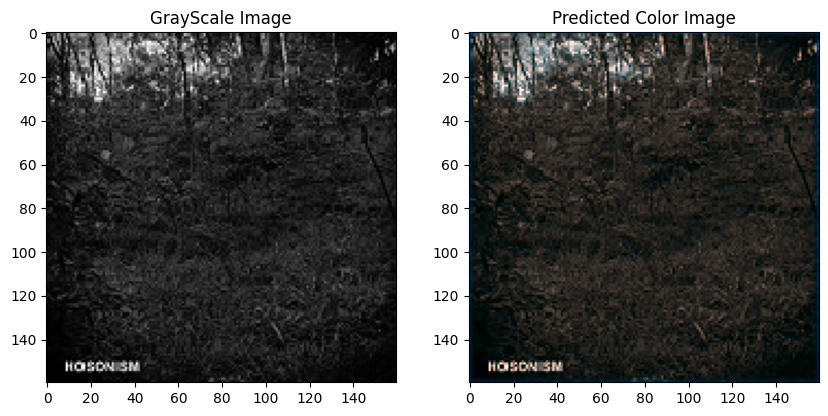

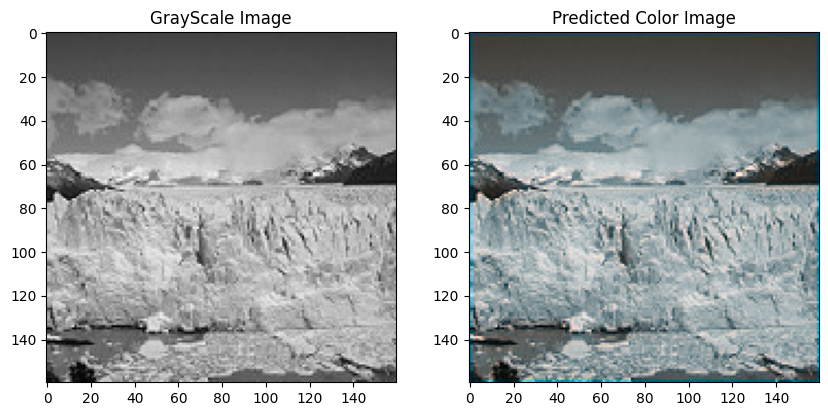

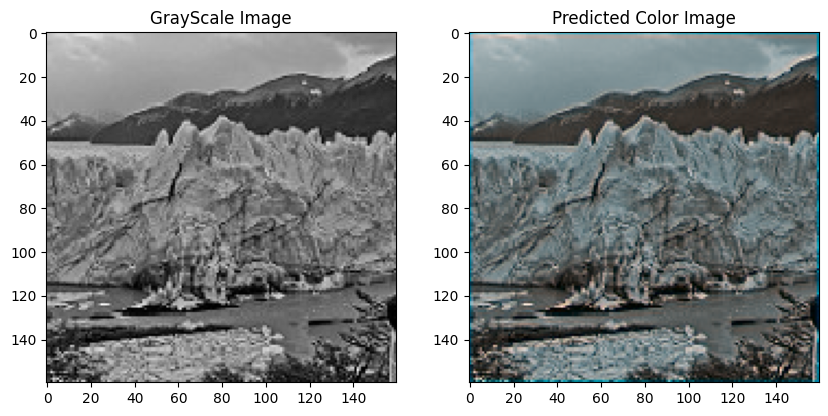

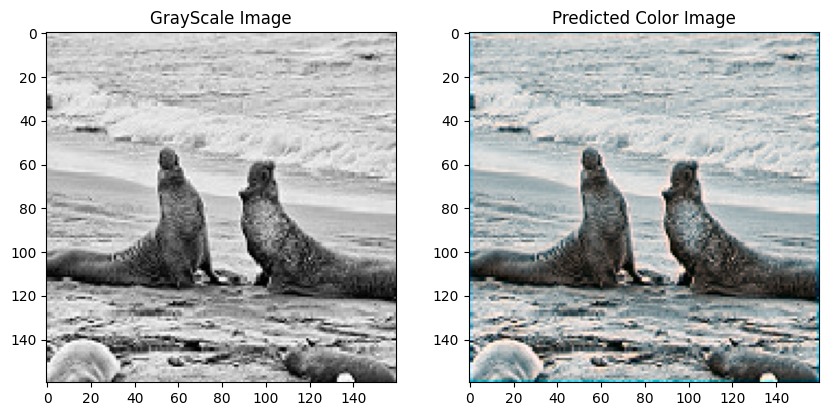

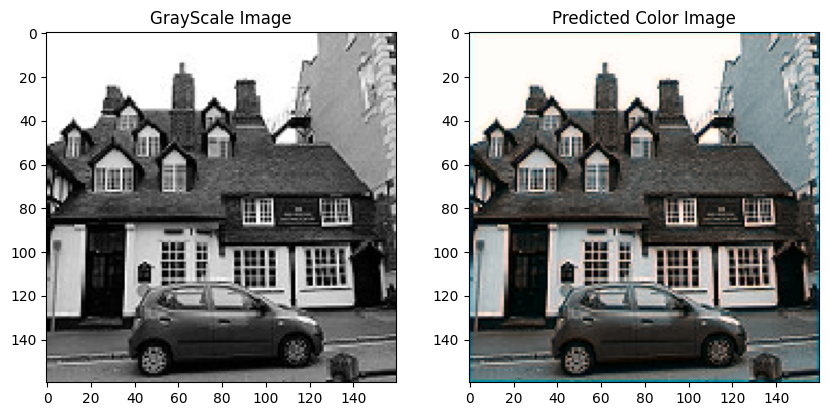

...

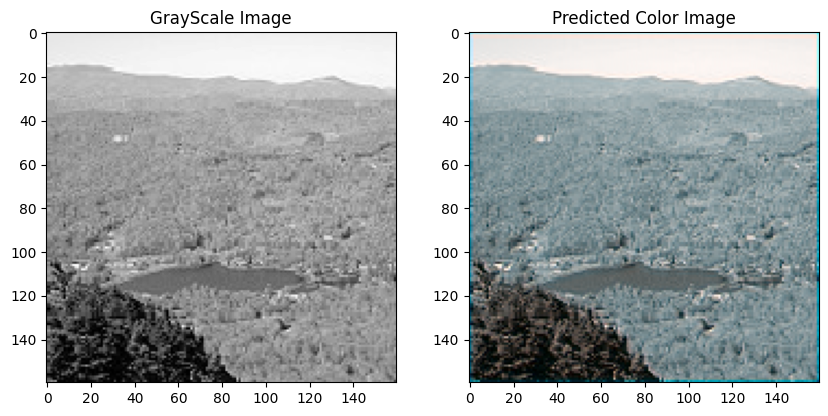

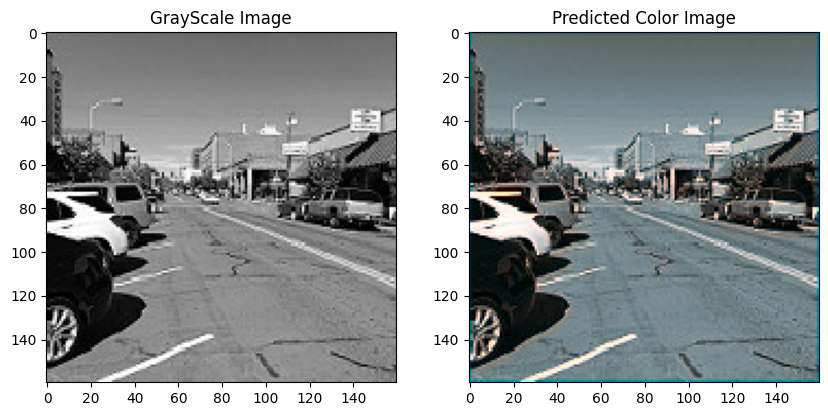

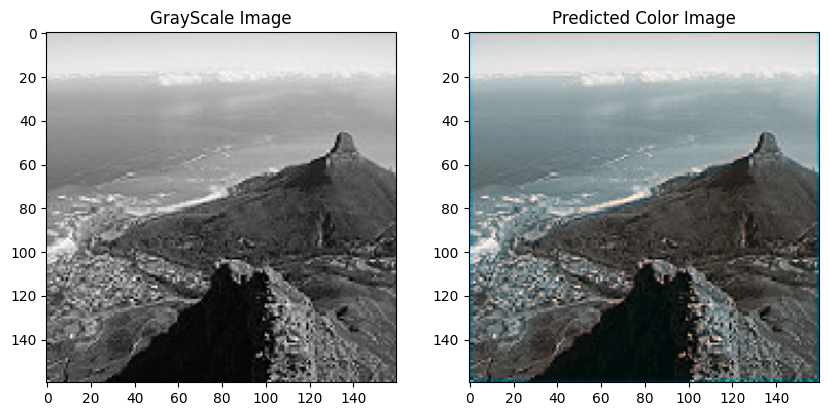

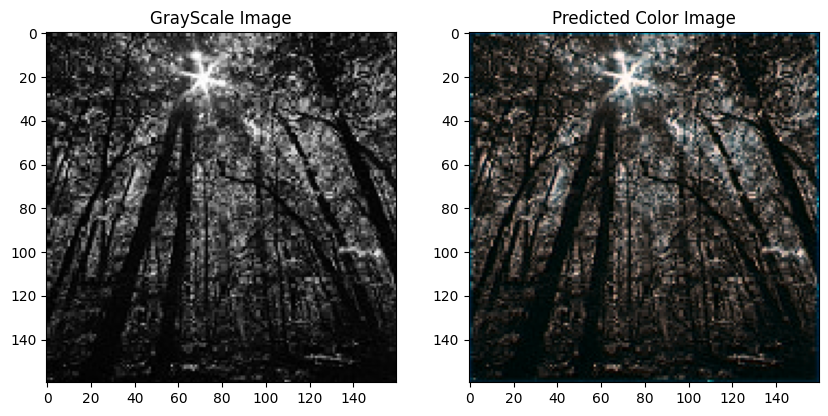

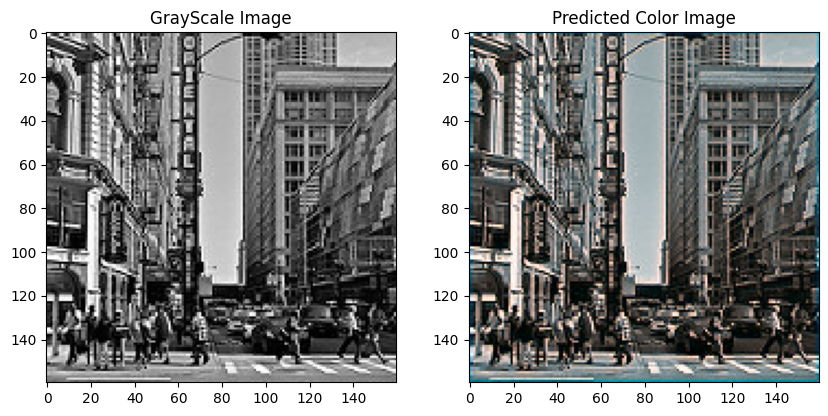

In [ ]:
##Train Data
i=0
while i<20:
    test_img,test_label = next(iter(train_loader))
    pred = model.forward(test_img[0].float().cuda().view(1,1,160,160))
    lab_pred = torch.cat((test_img[0].view(1,160,160),pred[0].cpu()),dim=0)
    lab_pred_inv_scaled = lab_pred.permute(1,2,0) * torch.tensor([100,255,255]) - torch.tensor([0,128,128])
    rgb_pred = lab2rgb(lab_pred_inv_scaled.detach().numpy())
    fig = plt.figure(figsize=(10,10))
    plt.subplot(221)
    plt.imshow(test_img[0].permute(1,2,0),cmap='gray')
    plt.title('GrayScale Image')
    plt.subplot(222)
    plt.imshow(rgb_pred)
    plt.title('Predicted Color Image')
    plt.show()
    i+=1

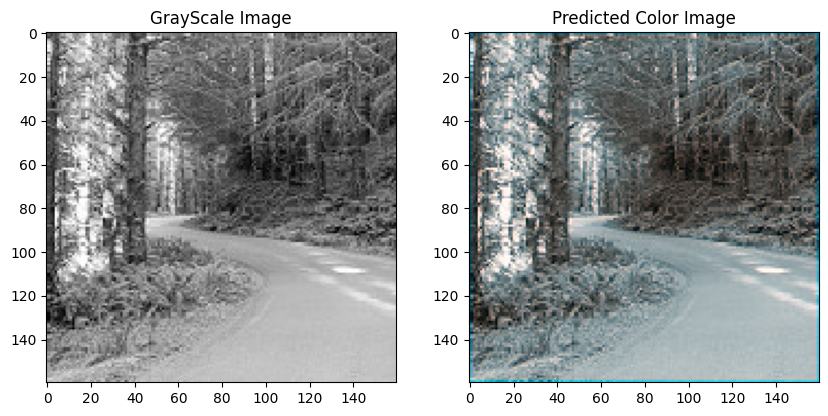

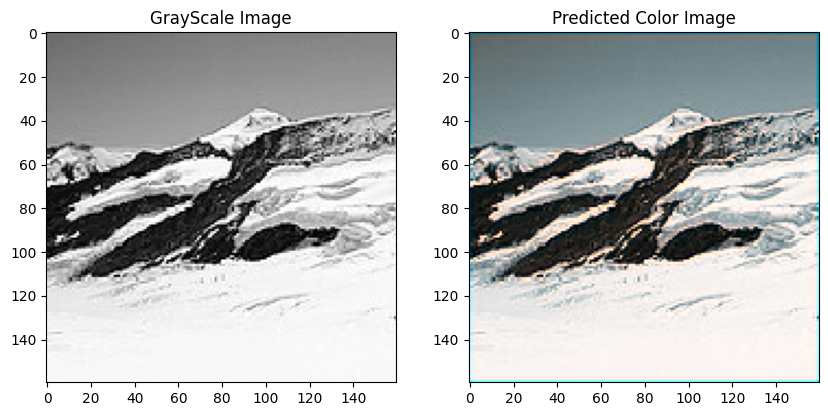

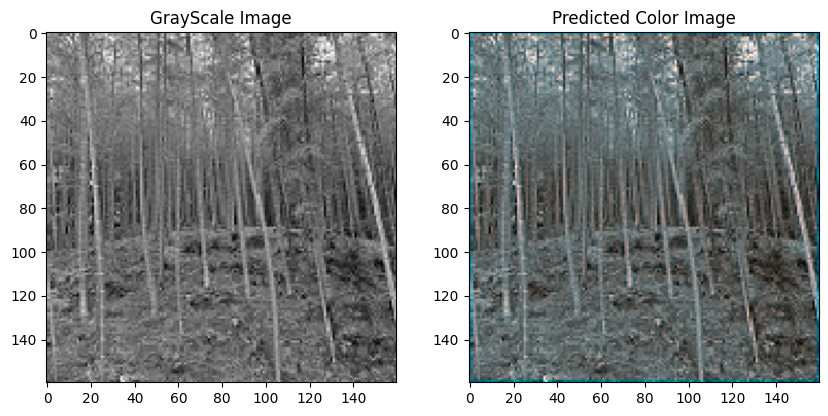

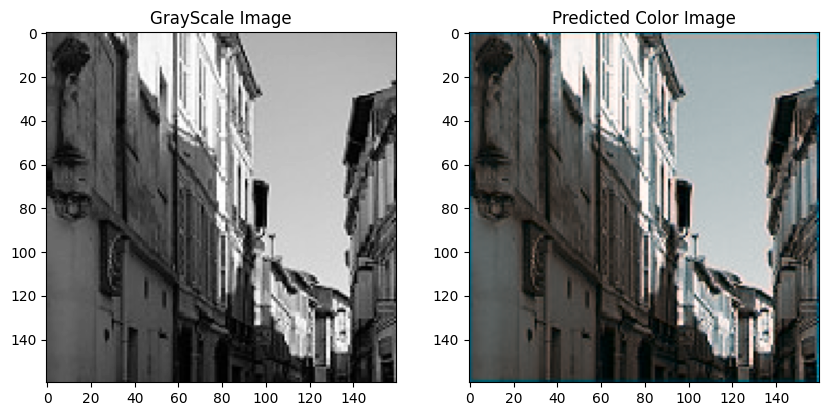

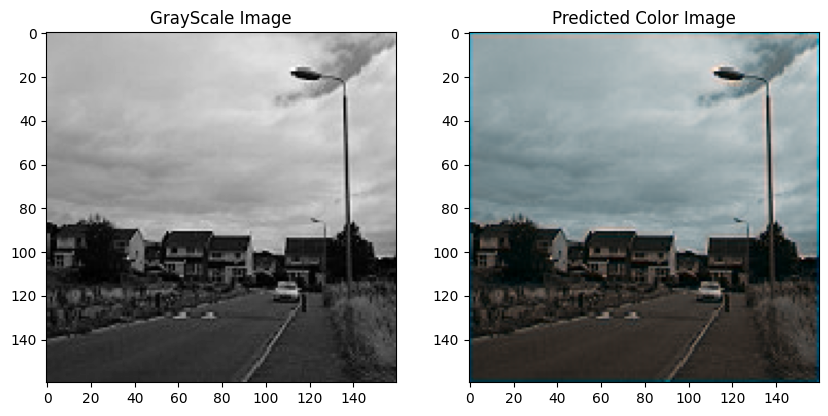

...

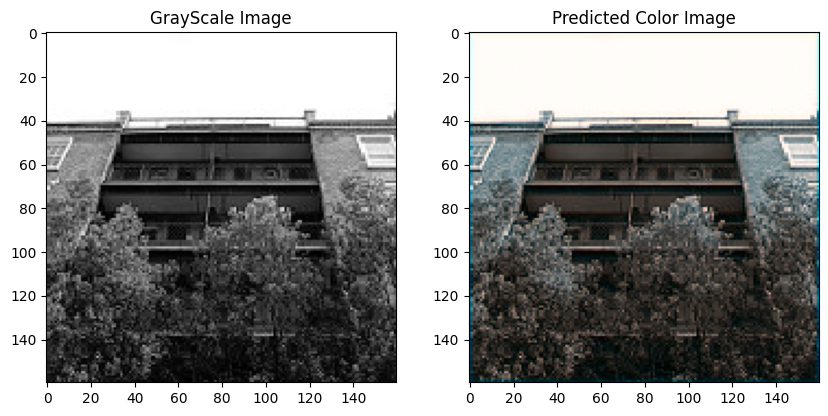

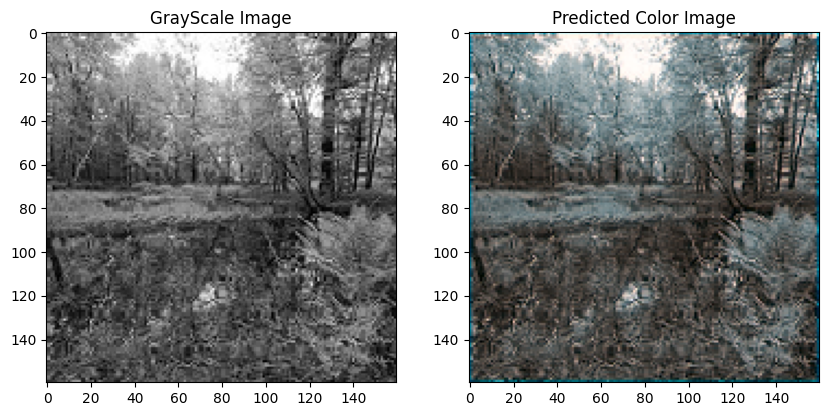

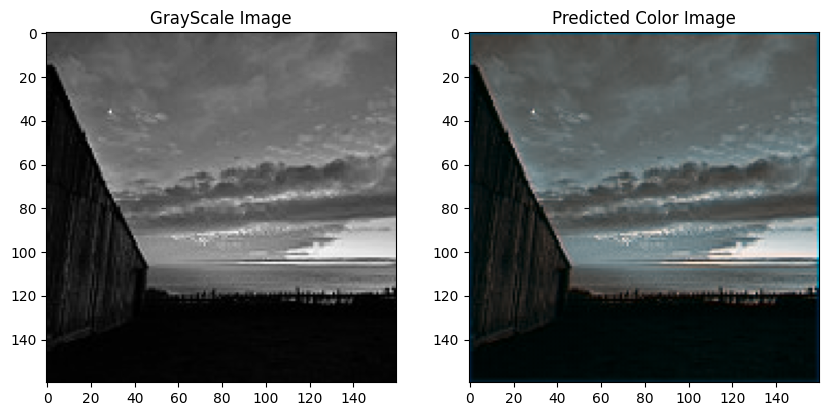

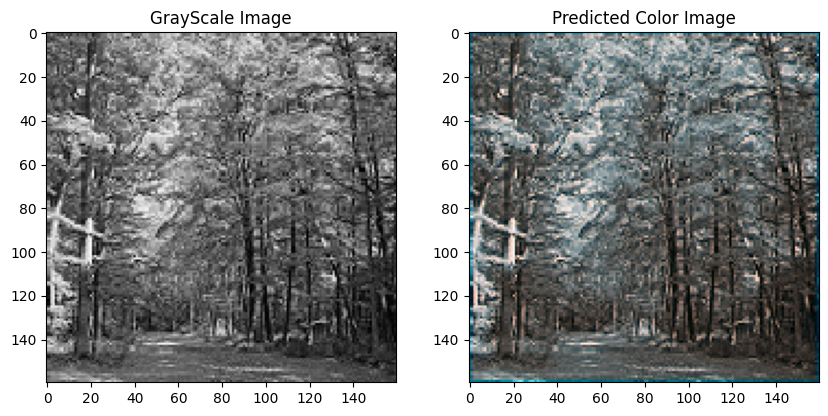

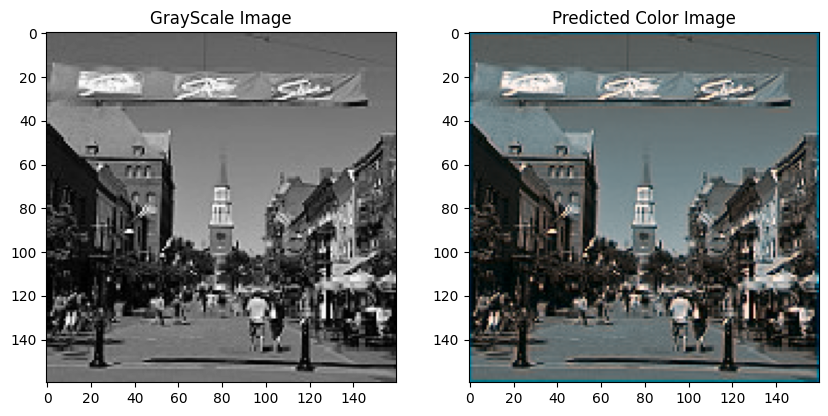

In [ ]:
##Test Data
i=0
while i<20:
    test_img,test_label = next(iter(test_loader))
    pred = model.forward(test_img[0].float().cuda().view(1,1,160,160))
    lab_pred = torch.cat((test_img[0].view(1,160,160),pred[0].cpu()),dim=0)
    lab_pred_inv_scaled = lab_pred.permute(1,2,0) * torch.tensor([100,255,255]) - torch.tensor([0,128,128])
    rgb_pred = lab2rgb(lab_pred_inv_scaled.detach().numpy())
    fig = plt.figure(figsize=(10,10))
    plt.subplot(221)
    plt.imshow(test_img[0].permute(1,2,0),cmap='gray')
    plt.title('GrayScale Image')
    plt.subplot(222)
    plt.imshow(rgb_pred)
    plt.title('Predicted Color Image')
    plt.show()
    i+=1

# **Plot**

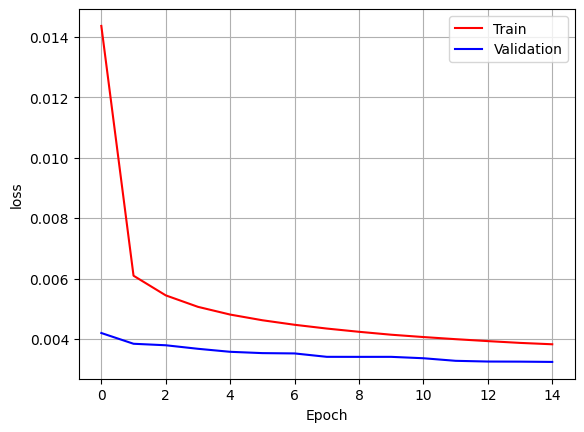

In [ ]:
plt.plot(range(epoch_counter), loss_train_hist, 'r-', label='Train')
plt.plot(range(epoch_counter), loss_valid_hist, 'b-', label='Validation')

plt.xlabel('Epoch')
plt.ylabel('loss')
plt.grid(True)
plt.legend()

# **Save**

In [ ]:
torch.save(model , 'model.pth')